# The TL;DR of EDA


<img src="https://images.squarespace-cdn.com/content/v1/62ebd8e38f68d651ae7892a2/9def1f60-daba-4ff6-838f-ea9bcfc7ee6d/PyData_logo.png?format=1500" width="400" height="130">

**TLV 2024**


## Dependencies

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

## Conect to dataset

In [27]:
%%capture
!pip install ucimlrepo
from ucimlrepo import fetch_ucirepo
wine = fetch_ucirepo(id=109)

df = wine.data.original
df.to_csv('wine.csv')

In [28]:
df

,Alcohol,Malicacid,Ash,Alcalinity_of_ash,Magnesium,Total_phenols,Flavanoids,Nonflavanoid_phenols,Proanthocyanins,Color_intensity,Hue,0D280_0D315_of_diluted_wines,Proline,class
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,3
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,3
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,3
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,3


In [29]:
df = pd.read_csv('wine.csv')

## Manual EDA - Pandas & Seaborn

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Unnamed: 0                    178 non-null    int64  
 1   Alcohol                       178 non-null    float64
 2   Malicacid                     178 non-null    float64
 3   Ash                           178 non-null    float64
 4   Alcalinity_of_ash             178 non-null    float64
 5   Magnesium                     178 non-null    int64  
 6   Total_phenols                 178 non-null    float64
 7   Flavanoids                    178 non-null    float64
 8   Nonflavanoid_phenols          178 non-null    float64
 9   Proanthocyanins               178 non-null    float64
 10  Color_intensity               178 non-null    float64
 11  Hue                           178 non-null    float64
 12  0D280_0D315_of_diluted_wines  178 non-null    float64
 13  Proli

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,178.0,88.500000,51.528309,0.00,44.2500,88.500,132.7500,177.00
Alcohol,178.0,13.000618,0.811827,11.03,12.3625,13.050,13.6775,14.83
Malicacid,178.0,2.336348,1.117146,0.74,1.6025,1.865,3.0825,5.80
Ash,178.0,2.366517,0.274344,1.36,2.2100,2.360,2.5575,3.23
Alcalinity_of_ash,178.0,19.494944,3.339564,10.60,17.2000,19.500,21.5000,30.00
Magnesium,178.0,99.741573,14.282484,70.00,88.0000,98.000,107.0000,162.00
Total_phenols,178.0,2.295112,0.625851,0.98,1.7425,2.355,2.8000,3.88
Flavanoids,178.0,2.029270,0.998859,0.34,1.2050,2.135,2.8750,5.08
Nonflavanoid_phenols,178.0,0.361854,0.124453,0.13,0.2700,0.340,0.4375,0.66
Proanthocyanins,178.0,1.590899,0.572359,0.41,1.2500,1.555,1.9500,3.58


<Axes: >

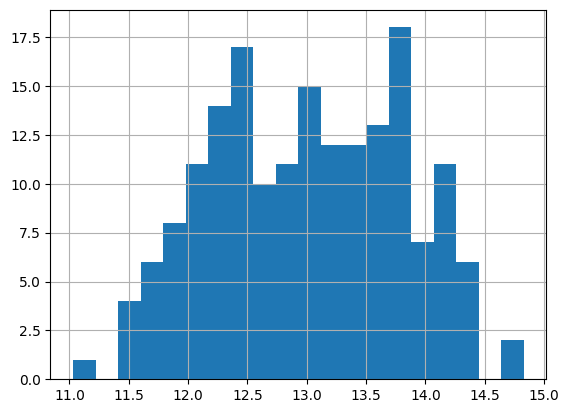

In [32]:
df['Alcohol'].hist(bins = 20)

In [33]:
df['class'].value_counts()

,count
class,
2,71
1,59
3,48


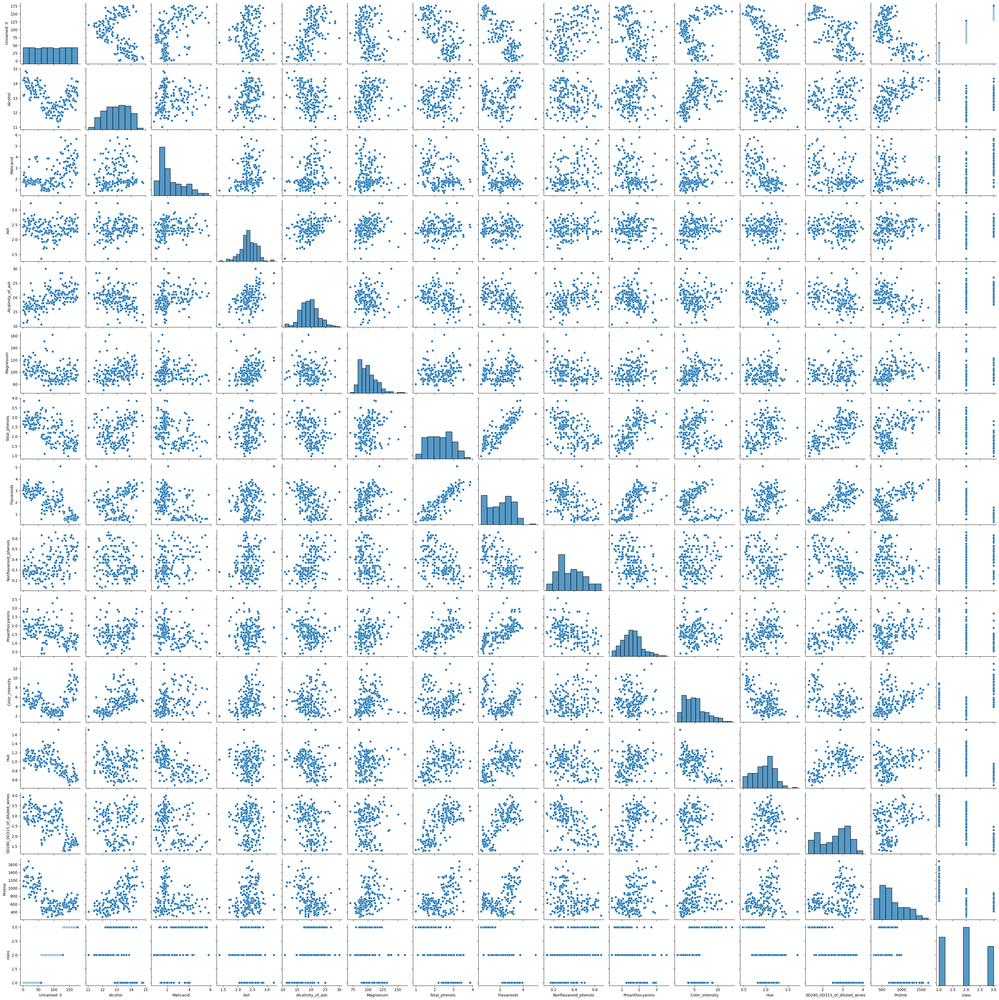

In [34]:
sns.pairplot(df)

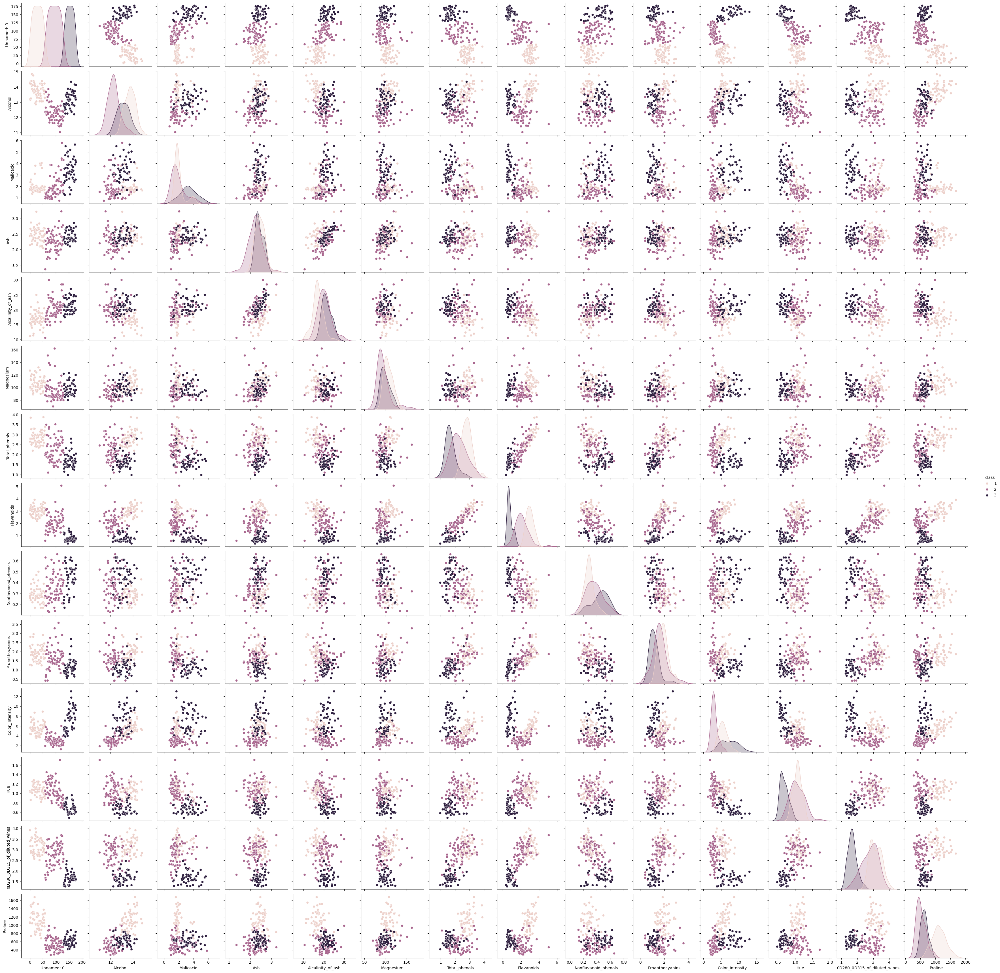

In [35]:
sns.pairplot(df, hue ='class')

## Automated EDA using Ydata - Profiling

In [36]:
%%capture
! pip install -U ydata-profiling

In [37]:
from ydata_profiling import ProfileReport

In [38]:
profile = ProfileReport(df, title = 'Dataset Profile Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Automated EDA using Clustering (Kmeans)

In [39]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [40]:
df_cluster = df.drop('class', axis=1)

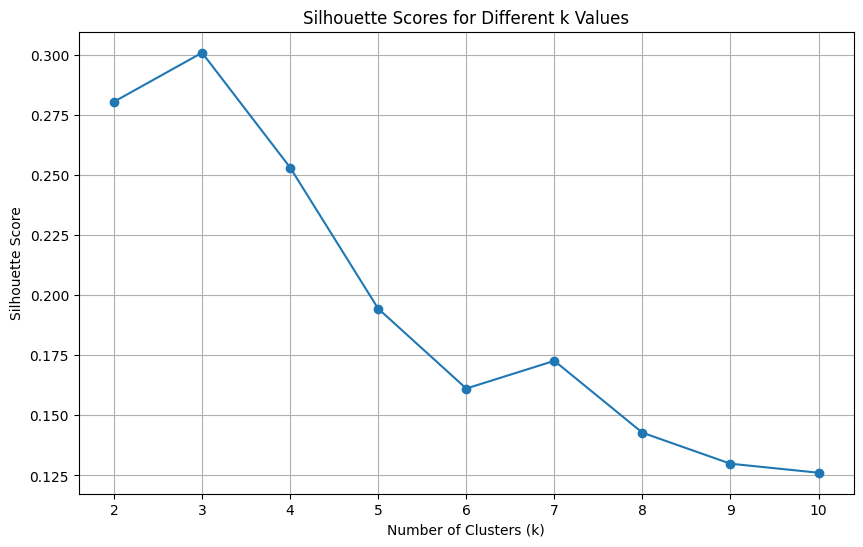

(3, 0.30095653661623695)

In [41]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_cluster)

range_k = range(2, 11)
silhouette_scores = []

for k in range_k:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(data_scaled)
    score = silhouette_score(data_scaled, cluster_labels)
    silhouette_scores.append(score)

best_k = range_k[silhouette_scores.index(max(silhouette_scores))]
best_score = max(silhouette_scores)

plt.figure(figsize=(10, 6))
plt.plot(range_k, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different k Values')
plt.grid(True)
plt.show()

best_k, best_score


In [42]:
from sklearn.decomposition import PCA

kmeans = KMeans(n_clusters=best_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_scaled)

pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

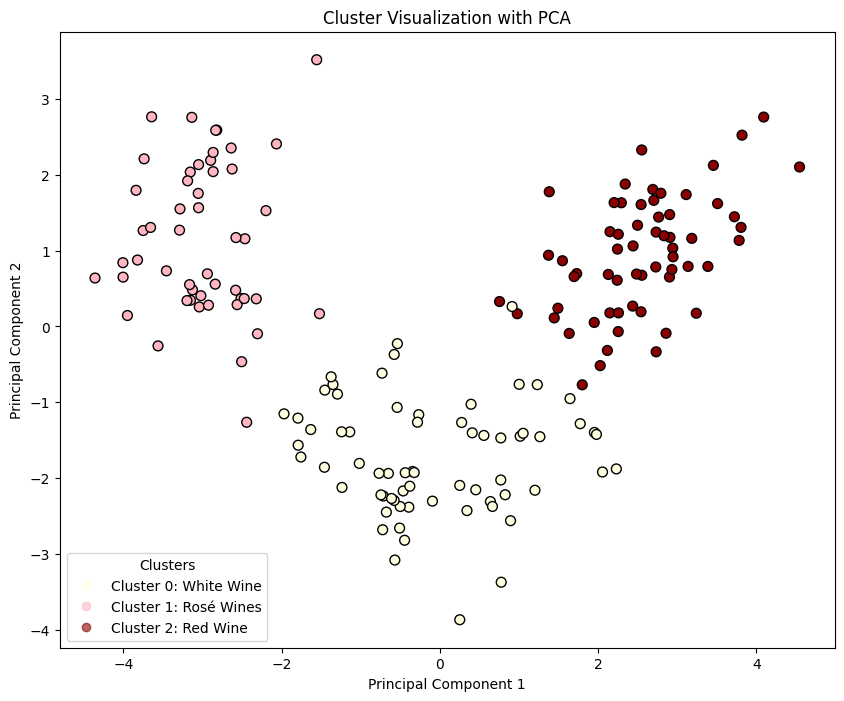

In [43]:
from matplotlib.colors import ListedColormap

cluster_colors = ['#FFFFE0', '#FFB6C1', '#8B0000']
custom_cmap = ListedColormap(cluster_colors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=cluster_labels, cmap=custom_cmap, edgecolor='k', s=50)
plt.title('Cluster Visualization with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

handles, _ = scatter.legend_elements(prop='colors', alpha=0.6)
legend_labels = ['Cluster 0: White Wine', 'Cluster 1: Rosé Wines', 'Cluster 2: Red Wine']
legend = plt.legend(handles, legend_labels, title="Clusters")

plt.grid(False)
plt.show()

In [44]:
df['Cluster Labels'] = cluster_labels
df

,Unnamed: 0,Alcohol,Malicacid,Ash,Alcalinity_of_ash,Magnesium,Total_phenols,Flavanoids,Nonflavanoid_phenols,Proanthocyanins,Color_intensity,Hue,0D280_0D315_of_diluted_wines,Proline,class,Cluster Labels
0,0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1,2
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1,2
2,2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1,2
3,3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1,2
4,4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,3,1
174,174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,3,1
175,175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,3,1
176,176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,3,1


In [45]:
crosstab = pd.crosstab(df['class'], df['Cluster Labels'])

# Display the cross-tabulation
crosstab

Cluster Labels,0,1,2
class,,,
1,0,0,59
2,67,2,2
3,0,48,0


In [46]:
wine_cluster_match = crosstab.idxmax(axis=1)

# Calculate accuracy
correct_matches = (df.apply(lambda x: x['Cluster Labels'] == wine_cluster_match[x['class']], axis=1)).sum()
accuracy = correct_matches / len(df)

accuracy

0.9775280898876404

## Automated EDA using LLMs

Insert below results into a chat based LLM model:

In [47]:
cluster_stats = df.groupby('Cluster Labels').describe()

cluster_stats.transpose()

Cluster Labels            0           1          2
Unnamed: 0 count  67.000000   50.000000  61.000000
           mean   94.104478  151.380000  30.803279
           std    20.845852   17.622909  19.665384
           min    59.000000   83.000000   0.000000
           25%    76.500000  140.250000  15.000000
...                     ...         ...        ...
class      min     2.000000    2.000000   1.000000
           25%     2.000000    3.000000   1.000000
           50%     2.000000    3.000000   1.000000
           75%     2.000000    3.000000   1.000000
           max     2.000000    3.000000   2.000000

[120 rows x 3 columns]

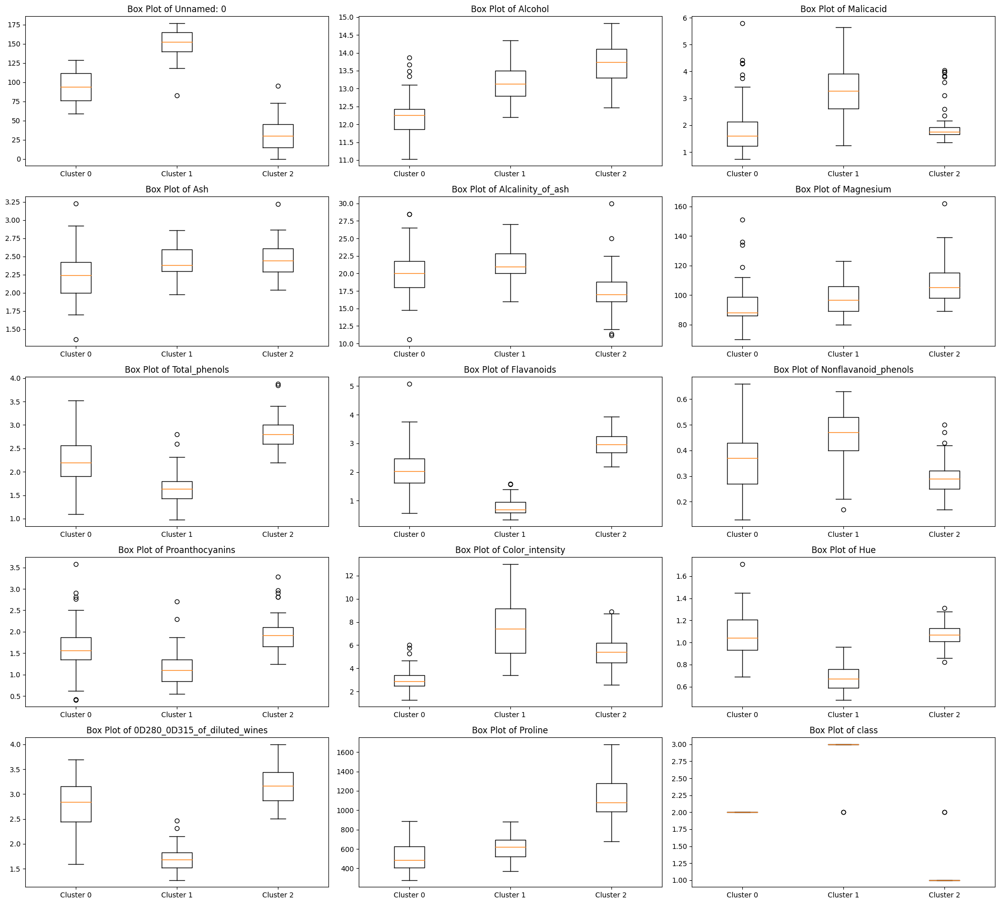

In [48]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 18))
num_features = len(df.columns) - 1  # exclude the cluster label column

for i, col in enumerate(df.columns[:-1]):  # exclude the cluster label column
    plt.subplot((num_features + 2) // 3, 3, i + 1)
    plt.title(f'Box Plot of {col}')
    plt.tight_layout()
    plt.boxplot([df[df['Cluster Labels'] == k][col] for k in range(3)], labels=[f'Cluster {k}' for k in range(3)])

plt.show()


In [49]:
key_features_means = df.groupby('Cluster Labels')[['Alcohol', 'Malicacid', 'Flavanoids', 'Color_intensity']].mean()
key_features_means

,Alcohol,Malicacid,Flavanoids,Color_intensity
Cluster Labels,,,,
0,12.246418,1.891642,2.085672,3.059701
1,13.144000,3.346200,0.807000,7.264400
2,13.711475,1.997049,2.969180,5.444590


### LLM output:

To guess which cluster might correspond to which type of wine, we would typically need additional specific wine characteristics or a labeled dataset indicating the type of wine each entry corresponds to. However, without explicit wine type labels in the dataset, we can make educated guesses based on typical wine profiles and how they might relate to the dataset's features, such as:

1. High Alcohol and Low Acidity (Malic Acid): Often corresponds to stronger, bolder wines like many reds.
2. High Flavanoids: Typically associated with red wines due to the presence of more tannins which come from the grape skins.
3. High Color Intensity: Likely indicates red wines due to deeper color from longer skin contact during fermentation.

Let's analyze the mean values of certain key features (like Alcohol, Malic Acid, Flavanoids, and Color Intensity) across the clusters to help hypothesize which cluster might represent which type of wine (red, white, or another type). We'll focus on these attributes to draw potential conclusions. ​​

Based on the average values of Alcohol, Malic Acid, Flavanoids, and Color Intensity for each cluster, we might hypothesize the following about the wine types:

**Cluster 0:**

Lower average alcohol content.
Moderate malic acid.
Moderate flavanoids.
Lower color intensity.
Potential Guess: Might represent white wines or light reds, as these typically have lower color intensity and a moderate amount of flavanoids.

**Cluster 1:**

Moderate alcohol content.
High malic acid.
Lower flavanoids.
High color intensity.
Potential Guess: Could represent rosé wines or specific types of red wines that are high in malic acid but not as rich in flavanoids, indicating less tannin presence.

**Cluster 2:**

Higher alcohol content.
Moderate malic acid.
High flavanoids.
Moderate to high color intensity.
Potential Guess: Likely represents red wines, especially those that are bolder and richer, indicated by higher alcohol, flavanoids (more tannins), and color intensity.